In [34]:
import os
import glob
import gc
from numpy import *
import numpy as np
from pathlib import Path
from importlib import reload

from matplotlib.pyplot import *
from matplotlib import pyplot as plt
from IPython.display import display, HTML
display(HTML("<style>.container { width:97% !important; }</style>"))

%matplotlib inline
rc('figure',figsize=(11,6))
rc('font',size=12)

# from qubicpack.qubicfp import qubicfp
from qubic import time_constants_tools as tct

# Directories

In [110]:
## Select a dataset corresponding to the TC measurement thorugh square modulation (external calsource or carbon fibres)
# day = '2023-03-31'
# day = '2023-04-17'
day = '2025-05-22'
# base_dir = '/home/nahue/Downloads/'
# base_dir = '/home/nahue-ofi/heavy-data/'
base_dir = '/home/nahue-ofi/Nextcloud/time-constants/'
# base_dir = '/home/nahue-ofi/Downloads/'
# base_dir = '/media/nahue/files_hdd/heavy-data/'
data_dir = base_dir + day + '/'
thedirs = np.sort(glob.glob(data_dir+'*carbonfibre*'))

## today 2025-05-27, I need to analyze
# Vbias = 2.8V
# carbonfibre:

#     2025-05-22_13.20.04__dome-open-carbonfibre (square wave, 50% duty cycle)
#     2025-05-22_13.22.49__dome-open-carbonfibre (square wave, 33% duty cycle)
#     2025-05-22_13.24.59__dome-open-carbonfibre (square wave, 33%, period 5 secs)
#     2025-05-22_14.28.12__dome-open-carbonfibre (sine wave, period 5 secs)

print('Here are all the available files')
for i in range(len(thedirs)):
    print(i,thedirs[i])

Here are all the available files
0 /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.20.04__dome-open-carbonfibre
1 /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.22.49__dome-open-carbonfibre
2 /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.24.59__dome-open-carbonfibre
3 /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_14.28.12__dome-open-carbonfibre


# Computing the time constants

In [111]:
## To plot the raw timelines

# a = qubicfp()
# a.assign_verbosity(0)
# a.read_qubicstudio_dataset(thedatadir)

# tt, alltod = a.tod()

# figure()
# for i in [22]:#np.arange(256)[21:24]:
#     plot(tt,alltod[i])

In [112]:
# lowcut = None
# highcut = None
# notch = None
# params_spl = 4
# params_poly = 1
# typefit = 'just_exp'

numfile = 2
thedatadir = thedirs[numfile]

print('We will analyse:')
print(numfile, thedatadir)

# base_save_path = os.getcwd()
base_save_path = data_dir
save_path = base_save_path+'results'

Path(save_path).mkdir( parents=True, exist_ok=True )
    
print(save_path)

We will analyse:
2 /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.24.59__dome-open-carbonfibre
/home/nahue-ofi/Nextcloud/time-constants/2025-05-22/results


Be aware that warnings won't be printed
ASIC1     Observation date: 2025-05-22 13:24:59.541000
ASIC1 Observation end date: 2025-05-22 14:02:50.667000
ASIC2     Observation date: 2025-05-22 13:24:59.539000
ASIC2 Observation end date: 2025-05-22 14:02:50.667000
No hkextern data found in directory: /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.24.59__dome-open-carbonfibre/Hks
No hkintern data found in directory: /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.24.59__dome-open-carbonfibre/Hks
No calsource data found in directory: /home/nahue-ofi/Nextcloud/time-constants/2025-05-22/2025-05-22_13.24.59__dome-open-carbonfibre/Hks
No calsource data found in directory: /home/nahue-ofi/Nextcloud/time-constants/calsource
No hornswitch data found in directory: /home/nahue-ofi/Nextcloud/time-constants/hornswitch
Please give a valid asic number
WARNING! The bias phase is different between the ASICs.  To see where, please set verbosity>2 and rerun bias_phase()
No

Detectors   0%[                                                  ]ETA:  --:--:--

Detectors 100%[===================================================]Time: 0:00:32


Folding TOD's timelines finished
Fitting the folded data median.
Fitting the folded data median finished.
Fitting the no normalized folded data.
Fitting No normalized folded data finished.
Fitting normalized folded data
Minuit Failed
TES# 18
Minuit Failed
TES# 141
Minuit Failed
TES# 190
Minuit Failed
TES# 191
Minuit Failed
TES# 225
Minuit Failed
TES# 226
Minuit Failed
TES# 229
Minuit Failed
TES# 230
Minuit Failed
TES# 248
Fitting normalized folded data finished
executing: self.detarray = '/home/nahue-ofi/qubic/qubic/calfiles/CalQubic_DetArray_v4_TD.fits'
executing: self.hornarray = '/home/nahue-ofi/qubic/qubic/calfiles/CalQubic_HornArray_TD.fits'
executing: self.optics = '/home/nahue-ofi/qubic/qubic/calfiles/CalQubic_Optics_v3_TD_150.txt'
executing: self.primbeam = '/home/nahue-ofi/qubic/qubic/calfiles/CalQubic_PrimBeam_v3.fits'
executing: self.synthbeam = '/home/nahue-ofi/qubic/qubic/calfiles/CalQubic_Synthbeam_Calibrated_Multifreq_FI.fits'
'compute_tc_squaremod' finished for 2025-05-

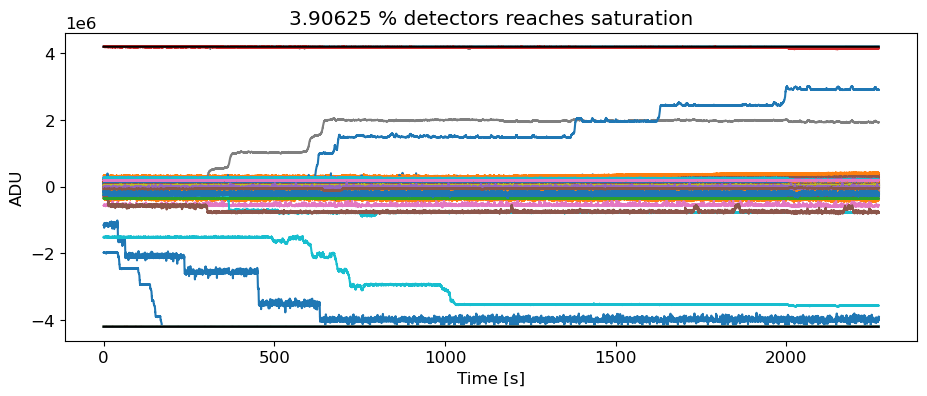

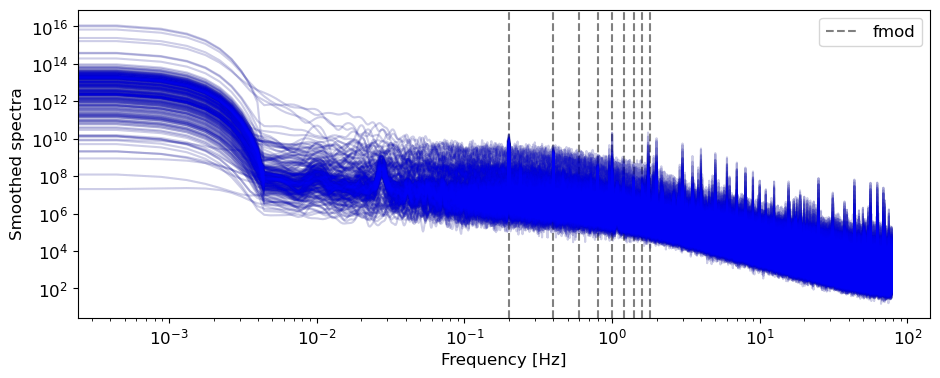

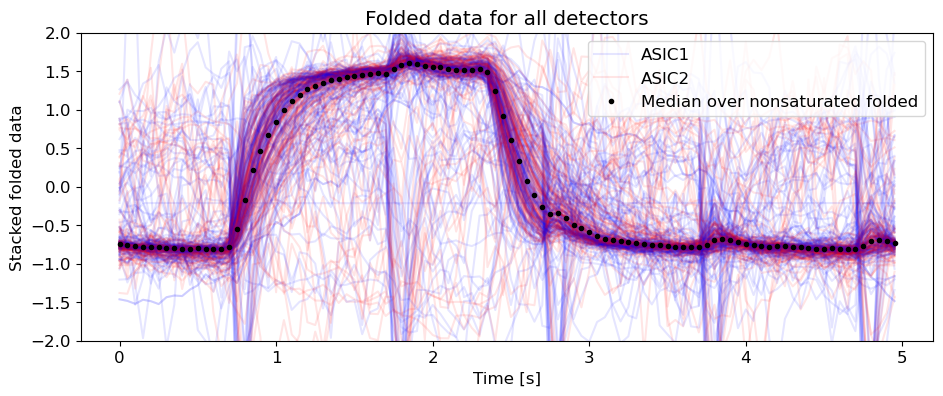

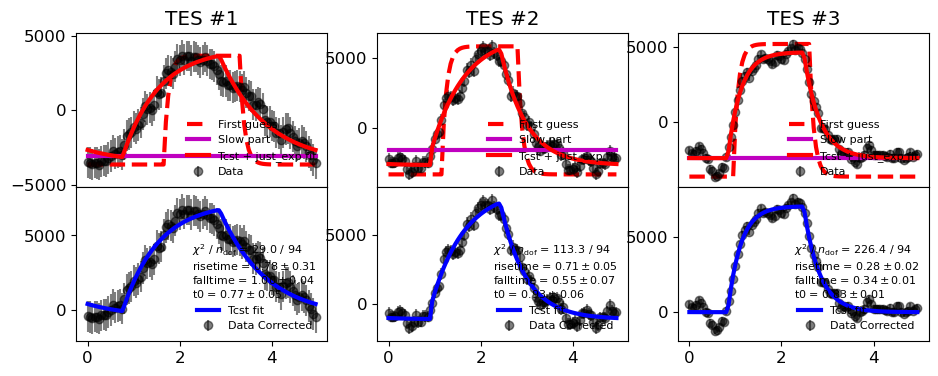

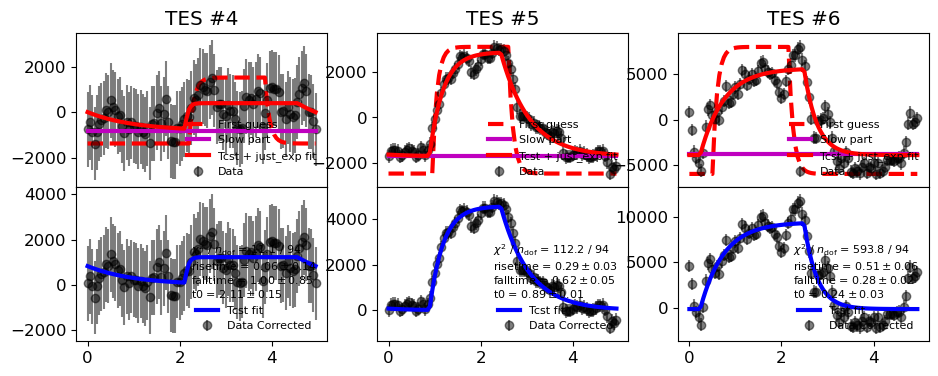

...

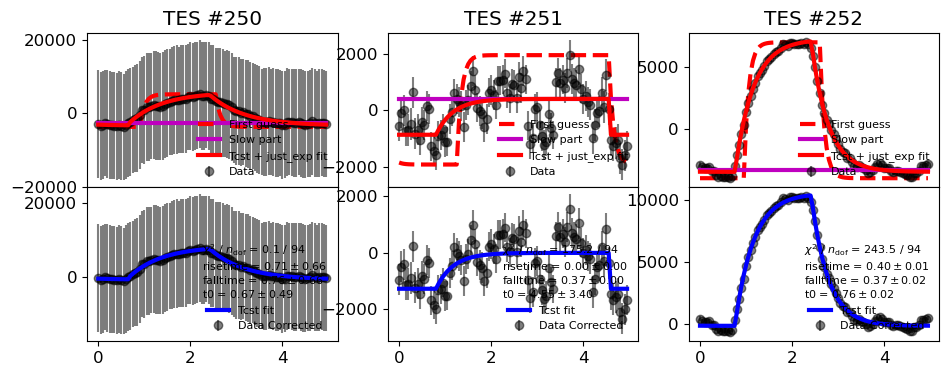

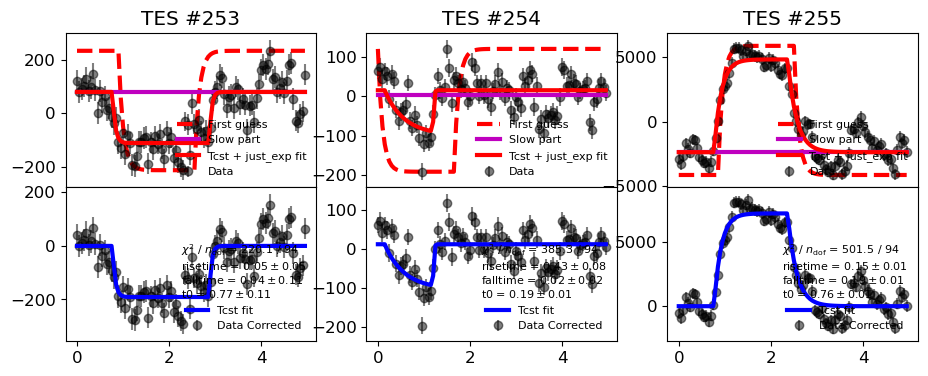

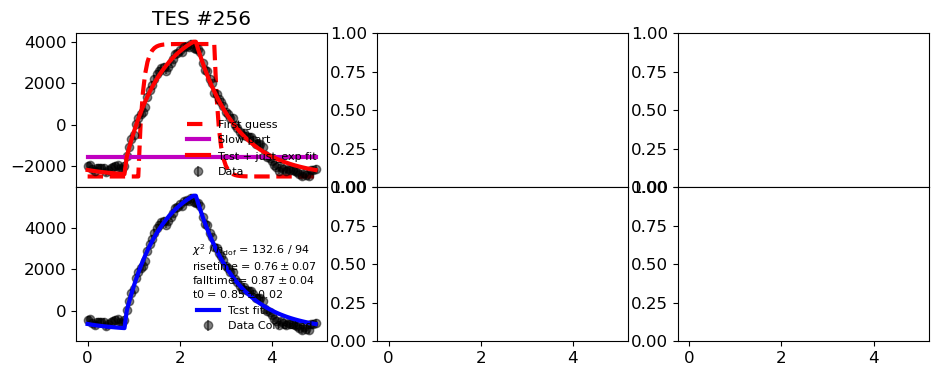

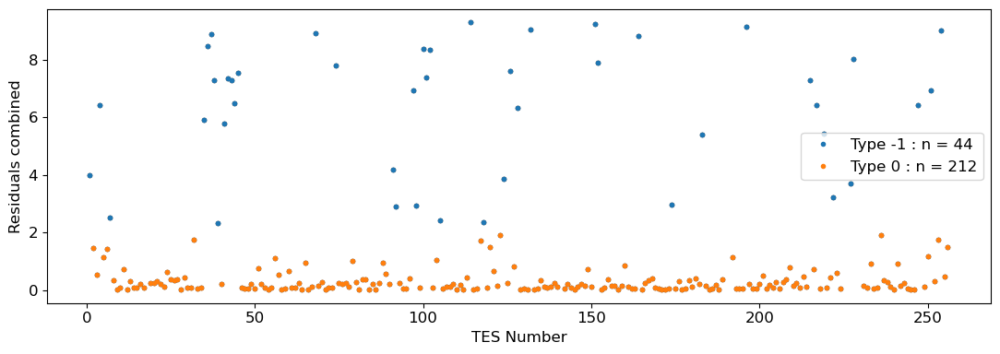

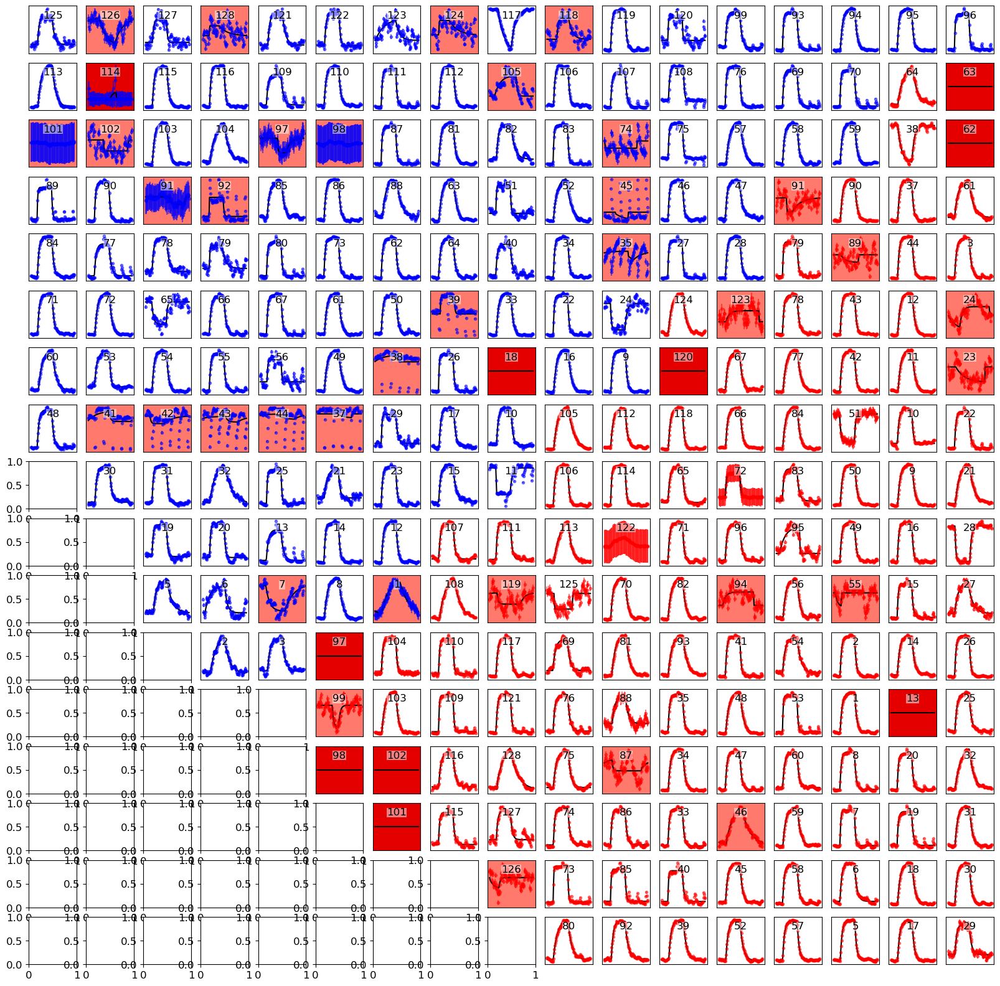

In [113]:
reload(tct)

import warnings
warnings.filterwarnings('ignore')
print('Be aware that warnings won\'t be printed')

only_overview = False
doplot = ['all']
saveplot = ['folded_data','focal_plane']#None
save_dict = True
force_sync = True
fmod = 0.2 #None
dutycycle = 50 #None

d = tct.compute_tc_squaremod(thedatadir, save_path = save_path, only_overview = only_overview, doplot = doplot,
                             saveplot = saveplot, save_dict = save_dict, fmod_explicit = fmod, dutycycle_explicit = dutycycle,
                             force_sync = force_sync)

# d = tct.compute_tc_squaremod(thedatadir, save_path = save_path, fmod = fmod, dutycycle = dc)

# for thedatadir in thedirs:
#     d = tct.compute_tc_squaremod(thedatadir, save_path = save_path, fmod = fmod, dutycycle = dc)

In [46]:
alldic = {}

results_dir = '/home/nahue-ofi/Nextcloud/time-constants/2025-05-22/results/'
thedirs_results = np.sort(glob.glob(results_dir+'*d__*'))

print(thedirs_results)

for i,thedatadir_i in enumerate(thedirs_results):
    try:
        alldic['{}'.format(i+1)] = np.load(thedatadir_i,allow_pickle=True).item()
    except:
        print('No directory')

['/home/nahue-ofi/Nextcloud/time-constants/2025-05-22/results/d__2025-05-22_13.20.04__dome-open-carbonfibre.npy'
 '/home/nahue-ofi/Nextcloud/time-constants/2025-05-22/results/d__2025-05-22_13.22.49__dome-open-carbonfibre.npy'
 '/home/nahue-ofi/Nextcloud/time-constants/2025-05-22/results/d__2025-05-22_13.24.59__dome-open-carbonfibre.npy']


In [28]:
# base_dir = '/home/nahue-ofi/Nextcloud/'
# data_dir = base_dir + 'time-constants/time_constants_results/all_TC_datasets_up_to_may_2023_3/'
# thedirs = np.sort(glob.glob(data_dir+'*d__*'))

# os.chdir(save_path)
# alldic = {}

# print(thedirs)
# print(np.shape(thedirs))

# for i,thedatadir_i in enumerate(thedirs):
#     try:
#         alldic['{}'.format(i+1)] = np.load(thedatadir_i,allow_pickle=True).item()
#     except:
#         print('No directory')

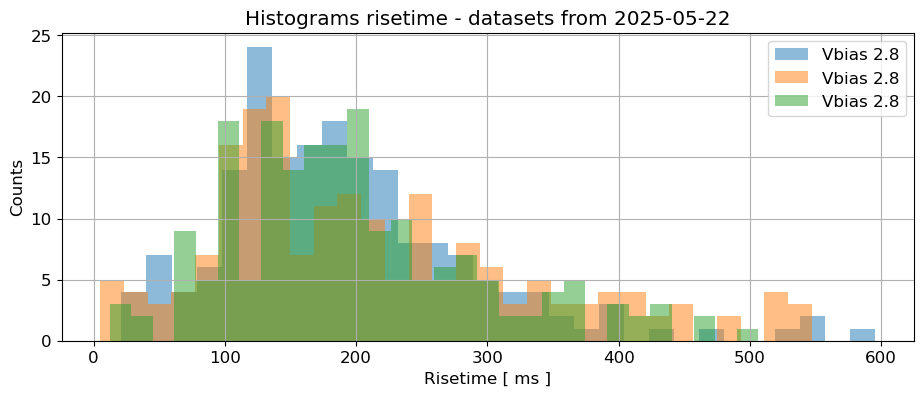

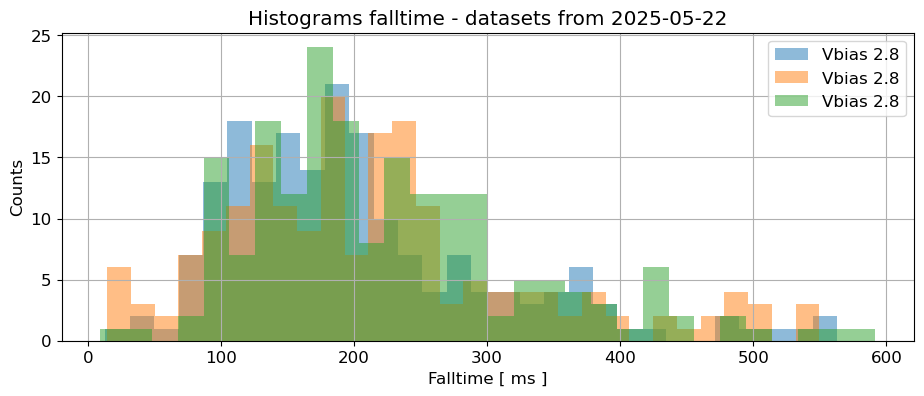

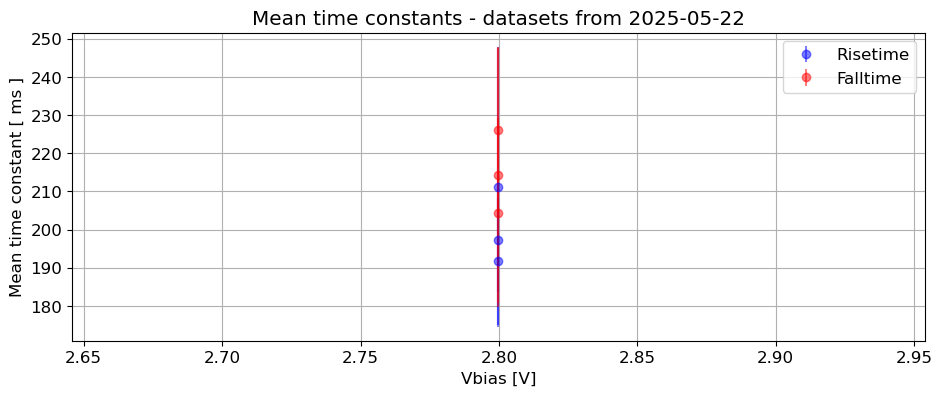

In [83]:
figure(1)

title('Histograms risetime - datasets from {}'.format(day))
ylabel('Counts')
xlabel('Risetime [ ms ]')


rt = np.zeros((256,len(thedirs_results)))
rt_error = np.zeros((256,len(thedirs_results)))
ft = np.zeros((256,len(thedirs_results)))
ft_error = np.zeros((256,len(thedirs_results)))
rt_mean = np.zeros(len(thedirs_results))
rt_mean_error = np.zeros(len(thedirs_results))
ft_mean = np.zeros(len(thedirs_results))
ft_mean_error = np.zeros(len(thedirs_results))
ok = np.zeros((256,len(thedirs_results)))
Vbias = np.zeros(len(thedirs_results))

min_cut = 0.005
max_cut = 0.6

for i in np.arange(len(thedirs_results)):
    ok_cuts_rt = (alldic['{}'.format(i+1)]['alltod_folded_nonorm']['risetime']>min_cut)&(alldic['{}'.format(i+1)]['alltod_folded_nonorm']['risetime']<max_cut)
    ok_cuts_ft = (alldic['{}'.format(i+1)]['alltod_folded_nonorm']['falltime']>min_cut)&(alldic['{}'.format(i+1)]['alltod_folded_nonorm']['falltime']<max_cut)
    okk = ok_cuts_ft * ok_cuts_rt * d['ok']['Residuals_combined']
    okk = okk.astype(bool)
    ok[:,i] = okk
    rt[:,i] = alldic['{}'.format(i+1)]['alltod_folded_nonorm']['risetime']
    rt_error[:,i] = alldic['{}'.format(i+1)]['alltod_folded_nonorm']['risetime_error']
    ft[:,i] = alldic['{}'.format(i+1)]['alltod_folded_nonorm']['falltime']
    ft_error[:,i] = alldic['{}'.format(i+1)]['alltod_folded_nonorm']['falltime_error']
    rt_mean[i] = np.mean(rt[:,i][okk])
    rt_mean_error[i] = np.sum(rt_error[:,i][okk])/(np.sum(okk))
    ft_mean[i] = np.mean(ft[:,i][okk])
    ft_mean_error[i] = np.sum(ft_error[:,i][okk])/(np.sum(okk))
    Vbias[i] = alldic['{}'.format(i+1)]['Vbias'] 

    figure(1)
    hist(1e3*rt[:,i][okk],30,alpha=0.5,label='Vbias {:.1f}'.format(Vbias[i]))
    figure(2)
    hist(1e3*ft[:,i][okk],30,alpha=0.5,label='Vbias {:.1f}'.format(Vbias[i]))

figure(1)
grid()
legend()

figure(2)
title('Histograms falltime - datasets from {}'.format(day))
ylabel('Counts')
xlabel('Falltime [ ms ]')

grid()
legend()

tight_layout


figure()
title('Mean time constants - datasets from {}'.format(day))
ylabel('Mean time constant [ ms ]')
xlabel('Vbias [V]')
errorbar(Vbias,1e3*rt_mean,yerr = 1e3*rt_mean_error,fmt='bo',alpha=0.5,label='Risetime')
errorbar(Vbias,1e3*ft_mean,yerr = 1e3*ft_mean_error,fmt='ro',alpha=0.5,label='Falltime')
grid()
legend()
tight_layout
show()

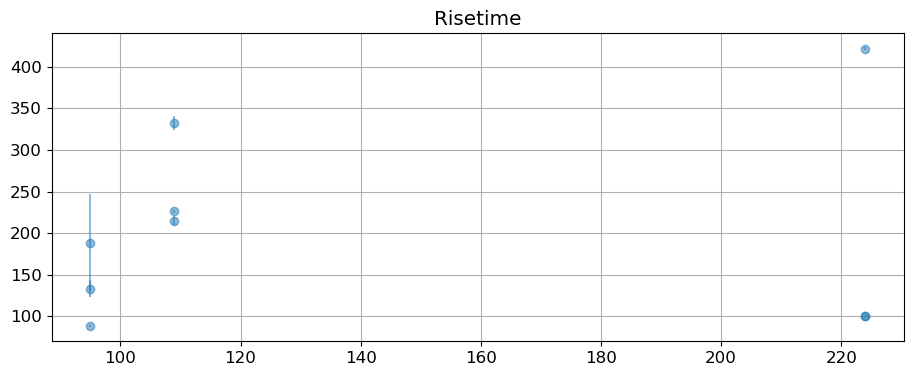

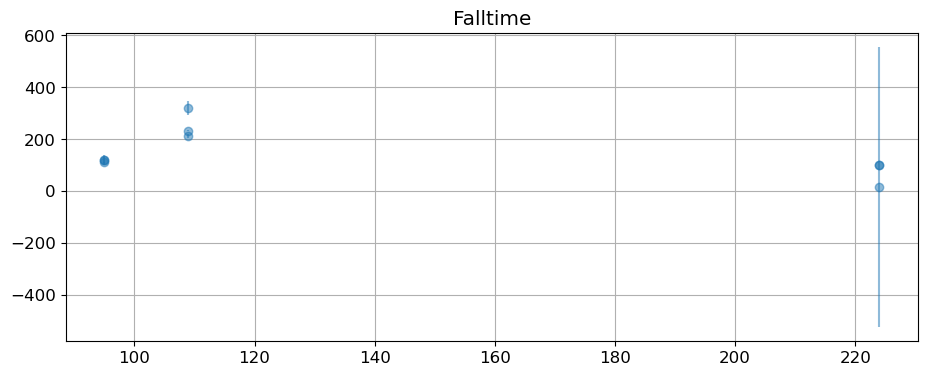

In [104]:
tesnum_pos_array = np.zeros(256)

tesnum_selected = np.array([96,110,225])

tesnum_i_array = tesnum_selected - 1

# print(tesnum_i)

for i,tesnum_i in enumerate(tesnum_i_array):
    for j in range(len(thedirs_results)):
        if ok[tesnum_i,j]:
            figure(3)
            errorbar(tesnum_i,1e3*rt[tesnum_i,j],yerr = 1e3*rt_error[tesnum_i,j],fmt='ro',alpha=0.5,color='C0')
            figure(4)
            errorbar(tesnum_i,1e3*ft[tesnum_i,j],yerr = 1e3*ft_error[tesnum_i,j],fmt='ro',alpha=0.5,color='C0')
# errorbar(Vbias,1e3*ft_mean,yerr = 1e3*ft_mean_error,fmt='ro',alpha=0.5,label='Falltime')
figure(3)
title('Risetime')
grid()
figure(4)
title('Falltime')
grid()


In [107]:
# rt_nonorm = alldic['1']['alltod_folded_nonorm']['risetime']
# rt_norm = alldic['1']['alltod_folded_norm']['risetime']
# b = np.abs(rt_nonorm-rt_norm)

# figure()
# plot(b,'.')
# yscale('log')

# results = np.array([b]).T
# labels = tct.run_DBSCAN(results, doplot=True, parnames = ['Risetime diff'],eps_cpar=0.01,min_samples_cpar = 10)

In [105]:
# # # print(alldic['1'])#['alltod_folded_nonorm']['amplitude'])
# amps_1 = np.abs(alldic['1']['alltod_folded_nonorm']['amplitude'])
# ok = alldic['1']['ok']['Residuals_combined'] & (amps_1<20000) & (amps_1>0)

# figure()
# hist(amps_1[ok],15)

In [106]:
# figure()
# plot(d['alltod_folded_norm']['residuals_fit_folded_median'],d['alltod_folded_norm']['residuals_folded_median'],'.')
# plot(d['alltod_folded_norm']['residuals_fit_folded_median'],d['alltod_folded_norm']['residuals_fit_folded_median'])
# # # show()

In [ ]:
# print(d['dataset_info'])
# print(d['Vbias'])